<a href="https://colab.research.google.com/github/pachterlab/Clytia_single_cell_2020/blob/master/notebooks/stimulation_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/pachterlab/Clytia_single_cell_2020/blob/master/notebooks/stimulation_Analysis.ipynb)

In [2]:
!date

Sun Jun 21 23:36:56 UTC 2020


In [3]:
#Import raw, unclustered stimulation data
!wget https://caltech.box.com/shared/static/cy5n9b6rdyk7v4uhvgvpkgotmchlts45

--2020-06-21 23:36:57--  https://caltech.box.com/shared/static/cy5n9b6rdyk7v4uhvgvpkgotmchlts45
Resolving caltech.box.com (caltech.box.com)... 107.152.29.197
Connecting to caltech.box.com (caltech.box.com)|107.152.29.197|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /public/static/cy5n9b6rdyk7v4uhvgvpkgotmchlts45 [following]
--2020-06-21 23:36:57--  https://caltech.box.com/public/static/cy5n9b6rdyk7v4uhvgvpkgotmchlts45
Reusing existing connection to caltech.box.com:443.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://caltech.app.box.com/public/static/cy5n9b6rdyk7v4uhvgvpkgotmchlts45 [following]
--2020-06-21 23:36:57--  https://caltech.app.box.com/public/static/cy5n9b6rdyk7v4uhvgvpkgotmchlts45
Resolving caltech.app.box.com (caltech.app.box.com)... 107.152.29.201
Connecting to caltech.app.box.com (caltech.app.box.com)|107.152.29.201|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: h

In [4]:
#Import previously saved, clustered, & filtered stimulation data 
!wget https://caltech.box.com/shared/static/hd36giuxz3zd933fh4bca3iqnykncro8

--2020-06-21 23:37:11--  https://caltech.box.com/shared/static/hd36giuxz3zd933fh4bca3iqnykncro8
Resolving caltech.box.com (caltech.box.com)... 107.152.29.197
Connecting to caltech.box.com (caltech.box.com)|107.152.29.197|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /public/static/hd36giuxz3zd933fh4bca3iqnykncro8 [following]
--2020-06-21 23:37:11--  https://caltech.box.com/public/static/hd36giuxz3zd933fh4bca3iqnykncro8
Reusing existing connection to caltech.box.com:443.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://caltech.app.box.com/public/static/hd36giuxz3zd933fh4bca3iqnykncro8 [following]
--2020-06-21 23:37:11--  https://caltech.app.box.com/public/static/hd36giuxz3zd933fh4bca3iqnykncro8
Resolving caltech.app.box.com (caltech.app.box.com)... 107.152.29.201
Connecting to caltech.app.box.com (caltech.app.box.com)|107.152.29.201|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: h

In [5]:
!pip install anndata
!pip install scanpy
!pip3 install leidenalg


###**Import Packages**

In [10]:
import scanpy as sc
import anndata
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import scipy.sparse
import seaborn as sns
import random

import warnings
warnings.filterwarnings('ignore')

from sklearn.neighbors import (KNeighborsClassifier,NeighborhoodComponentsAnalysis)
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE

sc.set_figure_params(dpi=125)
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


####**Read in raw data**

In [9]:
#Raw, unclustered h5ad
bus_stim = anndata.read('cy5n9b6rdyk7v4uhvgvpkgotmchlts45')
sc.pp.filter_cells(bus_stim, min_counts=1)
sc.pp.filter_genes(bus_stim, min_counts=1)
bus_stim.obs['n_countslog']=np.log10(bus_stim.obs['n_counts'])

In [10]:
#Normalize
sc.pp.normalize_per_cell(bus_stim, counts_per_cell_after=1e4) #or 1e5
bus_stim.raw = sc.pp.log1p(bus_stim, copy=True)
filter_result = sc.pp.filter_genes_dispersion(
    bus_stim.X, min_mean=0.0125, max_mean=4.5, min_disp=0.2)

In [11]:
bus_stim = bus_stim[:, filter_result.gene_subset]

print(bus_stim)

View of AnnData object with n_obs × n_vars = 23057 × 10260
    obs: 'batch', 'n_counts', 'n_countslog'
    var: 'n_counts'


In [12]:
#Clustering and visualization

sc.pp.scale(bus_stim, max_value=10)
sc.tl.pca(bus_stim, n_comps=60)
sc.tl.tsne(bus_stim, n_pcs=30)

sc.pp.neighbors(bus_stim,n_neighbors=50, n_pcs=30) #n_neighbors=5, n_pcs=15
sc.tl.leiden(bus_stim, resolution=0.8)
sc.tl.umap(bus_stim)

/usr/local/lib/python3.6/dist-packages/scanpy/preprocessing/_simple.py:848: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


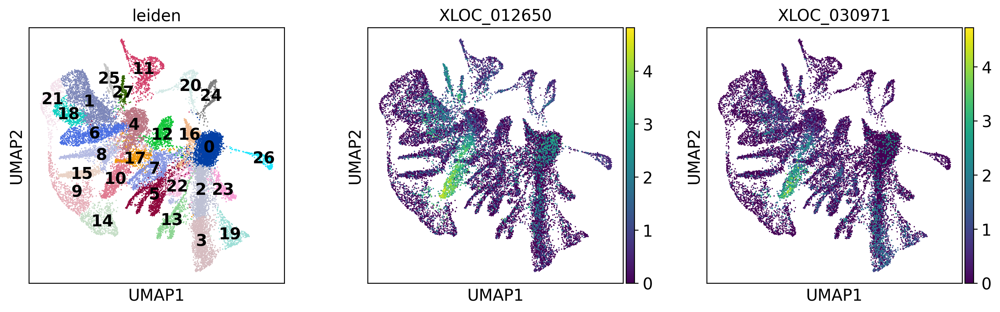

In [13]:
sc.pl.umap(bus_stim, color=['leiden','XLOC_012650','XLOC_030971'],legend_loc='on data',color_map='viridis')

In [1]:
#Test supervised NCA clustering
nca = NeighborhoodComponentsAnalysis(n_components=30)
knn = KNeighborsClassifier() # what is default # neighbors?
nca_pipe = Pipeline([('nca', nca), ('knn', knn)])
X_nca = nca.fit_transform(bus_stim.X,list(bus_stim.obs['leiden']))

X_embedded = TSNE(n_components=2).fit_transform(X_nca)
bus_stim.obsm['X_tsne'] = X_embedded
sc.pl.tsne(bus_stim,color=['leiden','XLOC_012650','XLOC_030971','n_countslog'],color_map='viridis',legend_loc='on data')

NameError: ignored

In [ ]:
#Assign labels to cells (condition and organism ID/#)

# def convertCode_str(b):
#     b = b.replace('-1', '-3')
#     b = b.replace('-2', '-1')
#     b = b.replace('-3', '-2')
#     return b

# fixed_bars = {}
# for b in barcodes:
#     fixed_bars[b] = barcodes_list[convertCode_str(b)][0]
    
# ids = []
# for name in bus_combo.obs_names.tolist():
#     for barcode, individ in fixed_bars.items():    
#         if (name in barcode):
#             ids += [int(individ)]

# condition = ['SW','SW','SW','SW','DI','DI','DI','DI','KCl','KCl','KCl','KCl']
# labels = []
# for name in bus_combo.obs_names.tolist():
#     for barcode, individ in fixed_bars.items():    
#         if name in barcode:
#             labels += [condition[int(individ)-1]]
            
bus_stim.obs['condition'] = pd.Categorical(labels)
bus_stim.obs['orgID'] = pd.Categorical(ids)
bus_stim

In [ ]:
#Remove low count region, '0'
bus_combo_noZero = bus_stim[~bus_stim.obs['leiden'].isin(['0'])]

#Re-cluster
nca = NeighborhoodComponentsAnalysis(n_components=30)
knn = KNeighborsClassifier() # what is default # neighbors?
nca_pipe = Pipeline([('nca', nca), ('knn', knn)])
X_nca = nca.fit_transform(bus_combo_noZero.X,list(bus_combo_noZero.obs['leiden']))

X_embedded = TSNE(n_components=2).fit_transform(X_nca)
bus_combo_noZero.obsm['X_tsne'] = X_embedded
sc.pl.tsne(bus_combo_noZero,color=['leiden','XLOC_012650','XLOC_030971'],color_map='viridis',legend_loc='on data')

###**Read in previously saved data**

In [7]:
#Filtered and clustered h5ad
bus_stim_clus = anndata.read('hd36giuxz3zd933fh4bca3iqnykncro8')

bus_stim_clus

/usr/local/lib/python3.6/dist-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,
/usr/local/lib/python3.6/dist-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  FutureWarning,


AnnData object with n_obs × n_vars = 19054 × 10260
    obs: 'batch', 'n_counts', 'n_countslog', 'leiden', 'condition', 'orgID'
    var: 'n_counts'
    uns: 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [8]:
#Calculate number of neighbors (out of top 15) with same condition
#Input adata object and what condition 
def neighborScores(adata,condition):
  sc.pp.neighbors(adata,n_neighbors=15)
  neighborDists = adata.uns['neighbors']['distances'].todense()
  counts = []

  for i in range(0,len(adata.obs_names)):
    cellNames = adata.obs_names
      
    #get fed observation for this cell
    cellObs = adata.obs['condition'][cellNames[i]]
      
    #get row for cell
    nonZero = neighborDists[i,:]>0
    l = nonZero.tolist()[0]

    cellRow = neighborDists[i,:]
    cellRow = cellRow[:,l]


    #get 'fed' observations
    obs = adata.obs['condition'][l]
      
    # count # in 'condition' observations == cell obs
    count = 0
    #if cellObs == condition:
    for j in obs:
      if j == condition:
        count += 1
              

    counts += [count]
      
  print(len(counts))

  return counts

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  """


19054


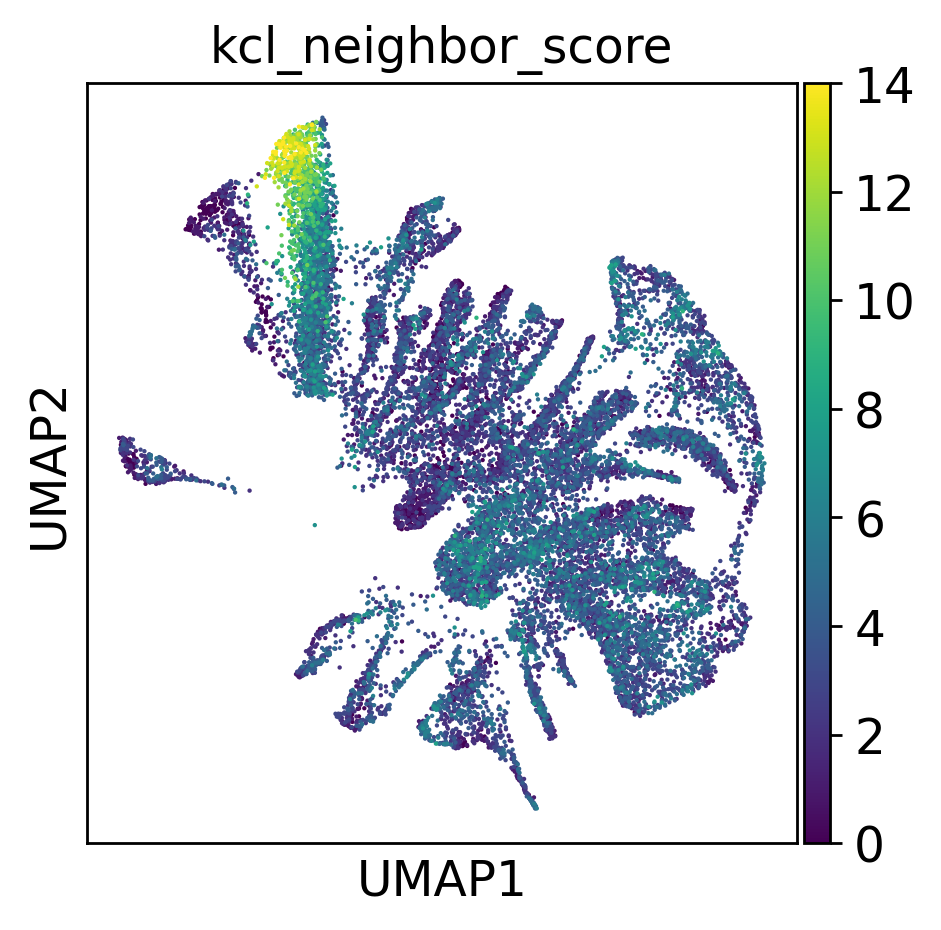

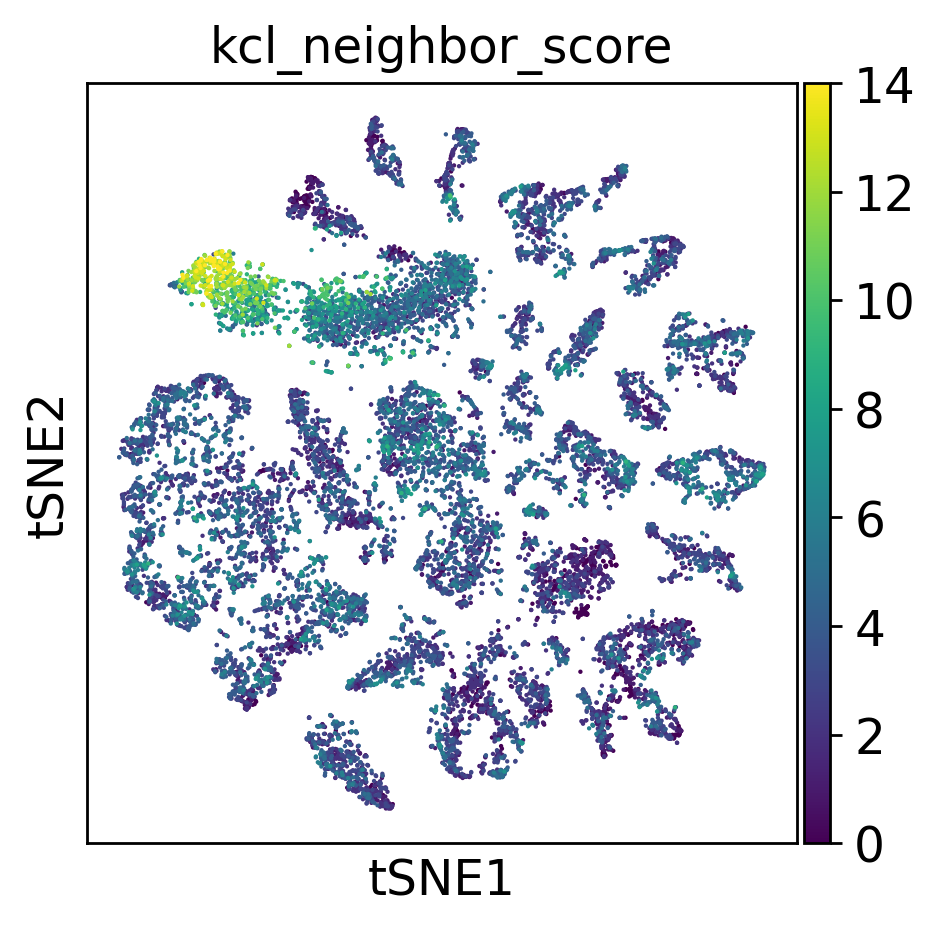

In [9]:
#Plot clusters
bus_stim_clus.obs['kcl_neighbor_score'] = neighborScores(bus_stim_clus,'KCl')
sc.pl.umap(bus_stim_clus,color='kcl_neighbor_score',color_map='viridis')
sc.pl.tsne(bus_stim_clus,color='kcl_neighbor_score',color_map='viridis')

19054


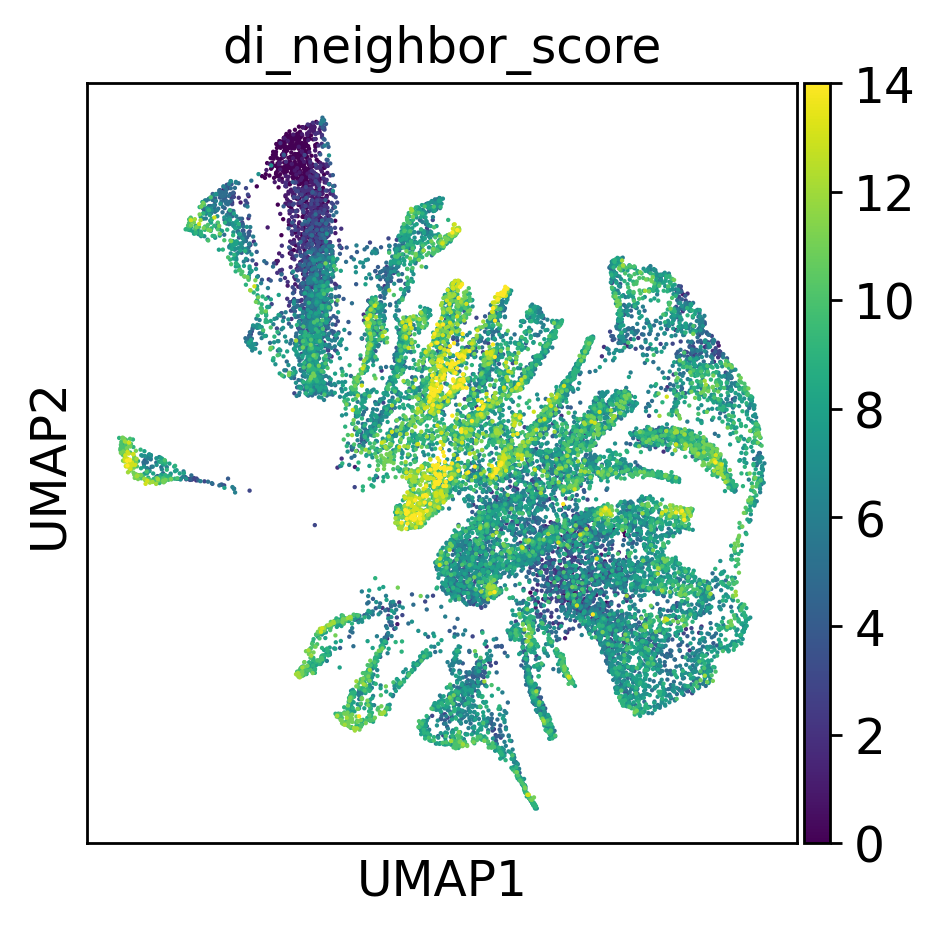

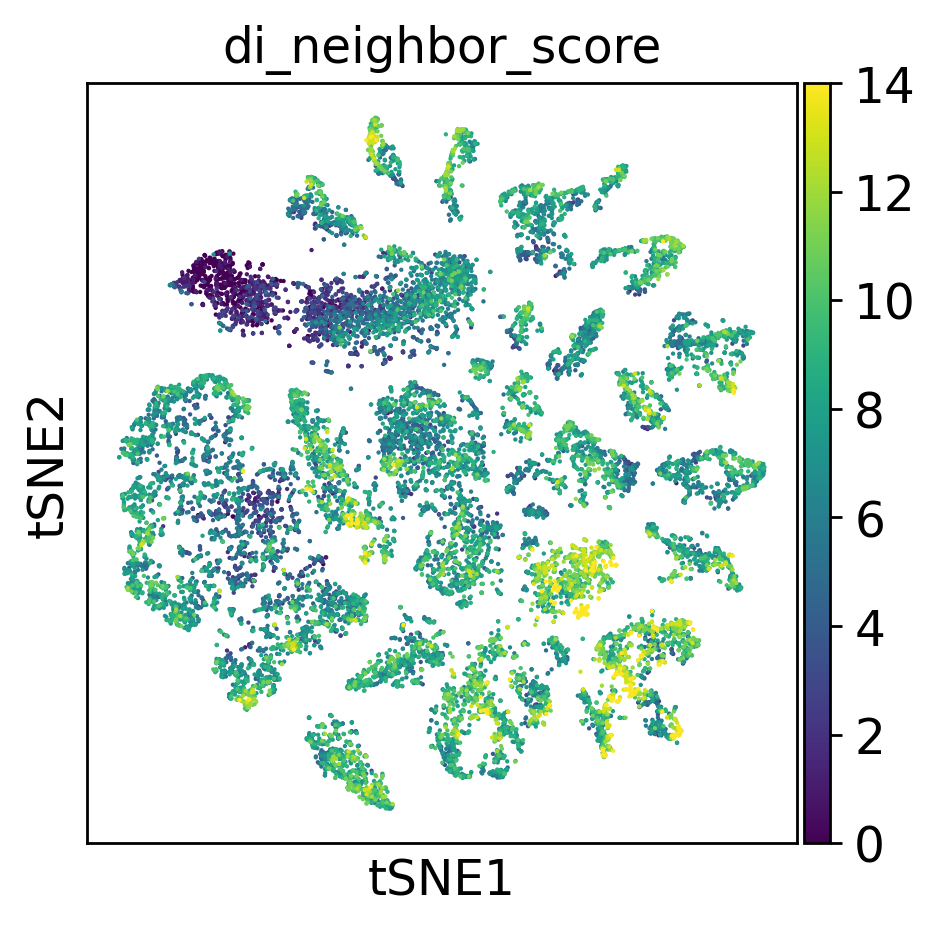

In [11]:
bus_stim_clus.obs['di_neighbor_score'] = neighborScores(bus_stim_clus,'DI')
sc.pl.umap(bus_stim_clus,color='di_neighbor_score',color_map='viridis')
sc.pl.tsne(bus_stim_clus,color='di_neighbor_score',color_map='viridis')

19054


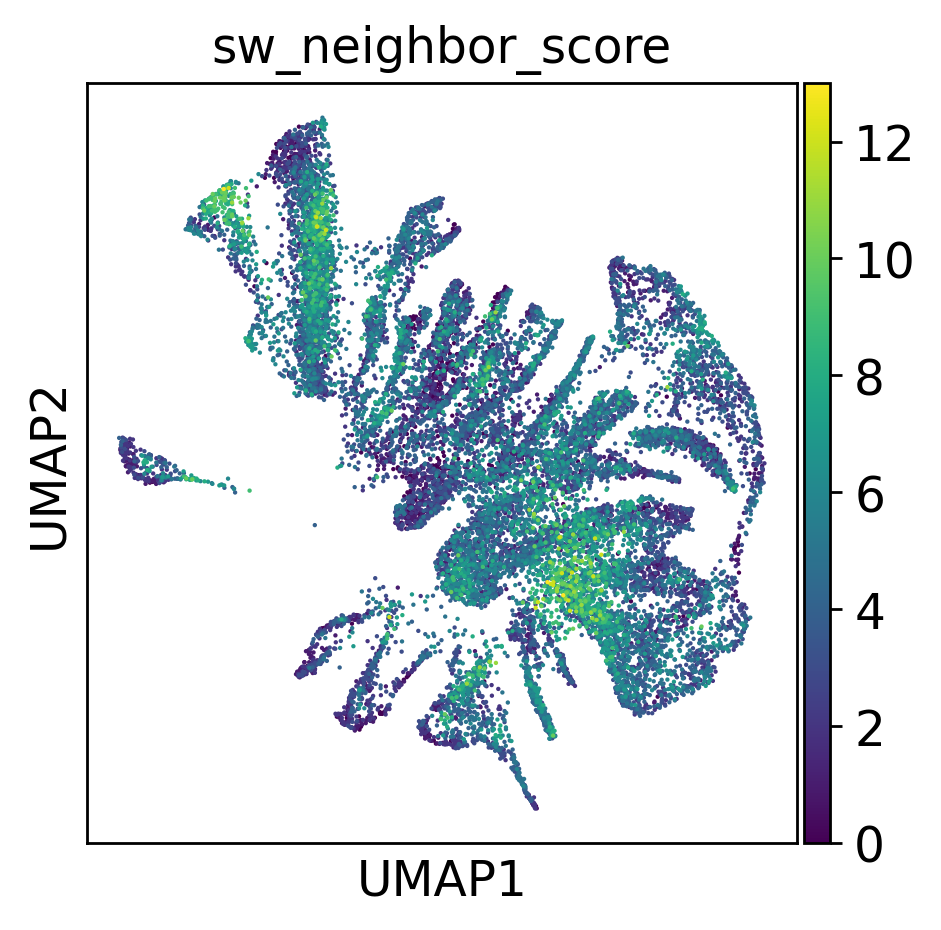

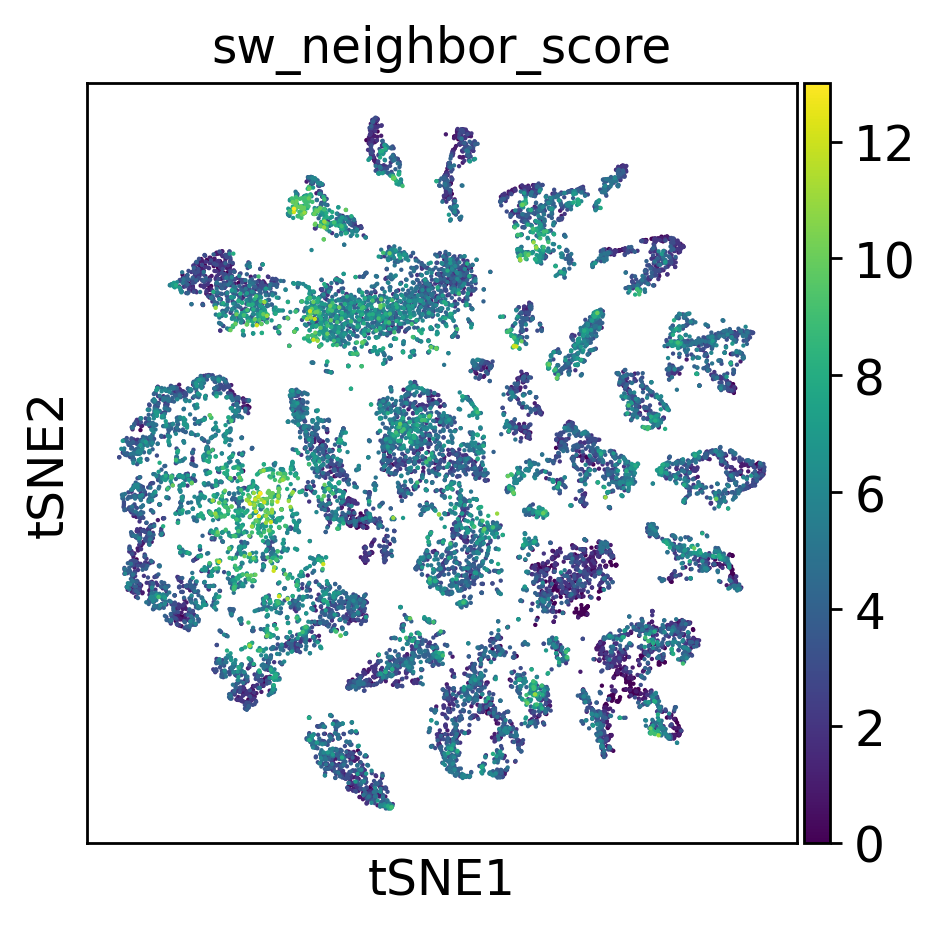

In [12]:
bus_stim_clus.obs['sw_neighbor_score'] = neighborScores(bus_stim_clus,'SW')
sc.pl.umap(bus_stim_clus,color='sw_neighbor_score',color_map='viridis')
sc.pl.tsne(bus_stim_clus,color='sw_neighbor_score',color_map='viridis')

###**PAGA Pseudotime Analysis**

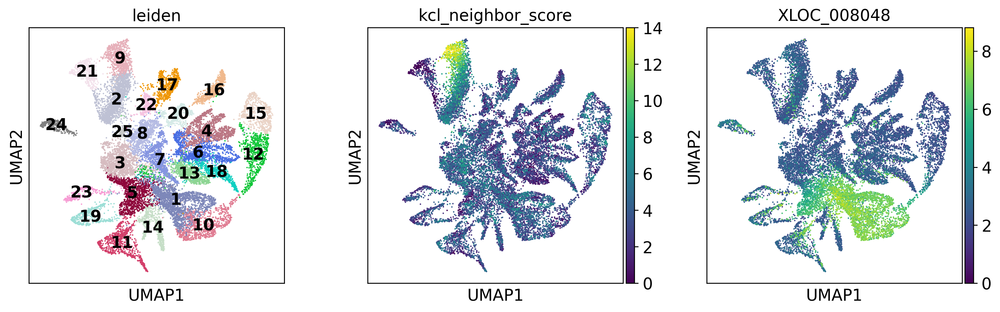

In [14]:
#New umap embedding
sc.pp.neighbors(bus_stim_clus,n_neighbors=50, n_pcs=30) #n_neighbors=5, n_pcs=15
sc.tl.umap(bus_stim_clus)
sc.pl.umap(bus_stim_clus, color=['leiden','kcl_neighbor_score','XLOC_008048'],legend_loc='on data',color_map='viridis')

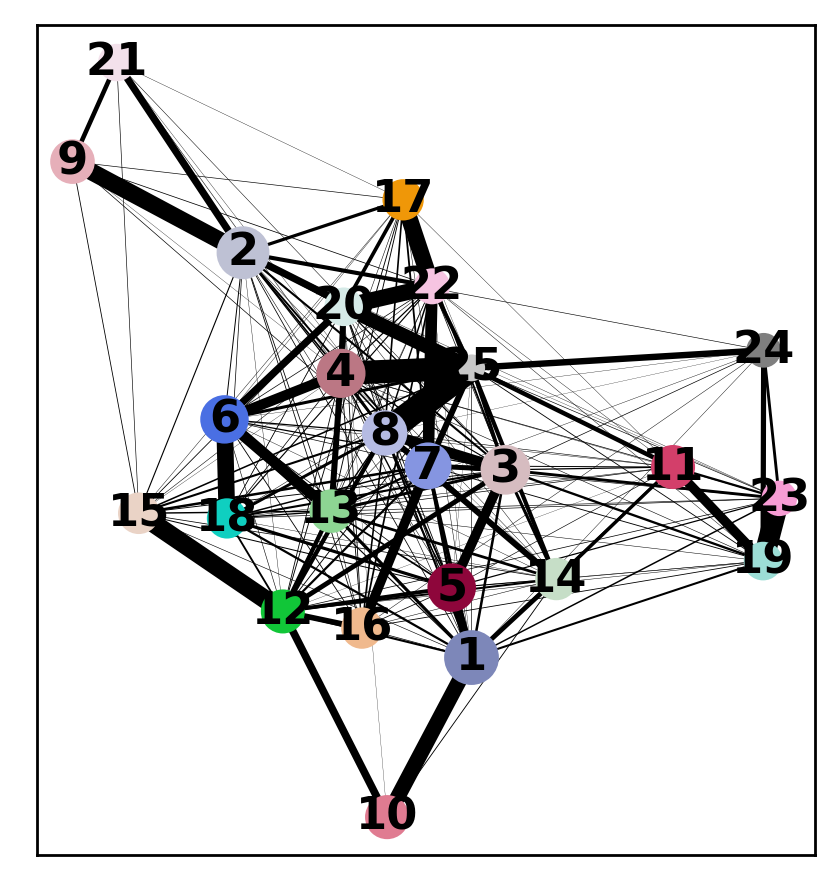

In [16]:
#Create PAGA Graph
sc.tl.paga(bus_stim_clus, groups='leiden')

sc.pl.paga(bus_stim_clus, color=['leiden'])


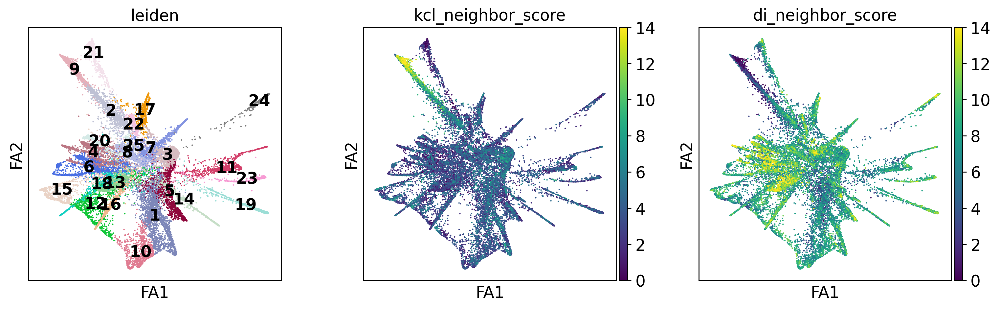

In [17]:
#Draw PAGA graph on embedding

sc.tl.draw_graph(bus_stim_clus, init_pos='paga')


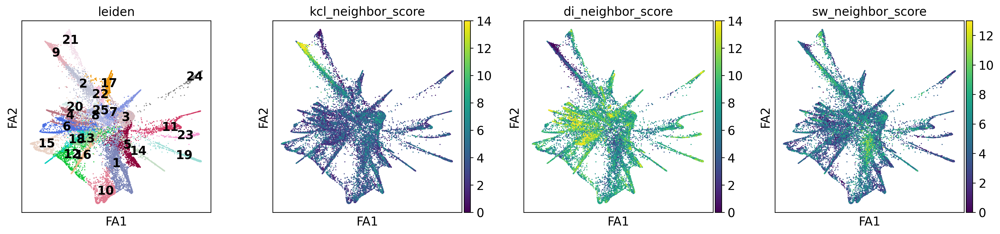

In [18]:
sc.pl.draw_graph(bus_stim_clus, color=['leiden', 'kcl_neighbor_score','di_neighbor_score','sw_neighbor_score'], legend_loc='on data',color_map='viridis')

In [19]:
bus_stim_clus.uns['iroot'] = np.flatnonzero(bus_stim_clus.obs['leiden']  == '3')[0]

In [20]:
sc.tl.dpt(bus_stim_clus)

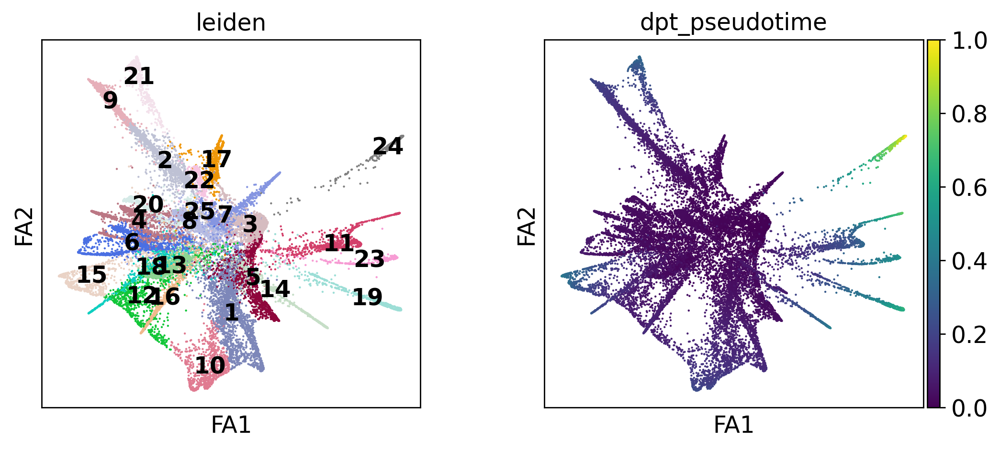

In [21]:
sc.pl.draw_graph(bus_stim_clus, color=['leiden', 'dpt_pseudotime'], legend_loc='on data',color_map='viridis')